# Wines Points prediction 

In [23]:
%load_ext autoreload
%autoreload 2
import sys; sys.path.append('../')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Here we will try to predict the points a wine will get based on known characteristics (i.e. features, in the ML terminology). The mine point in this stage is to establish a simple, ideally super cost effective, basline.
In the real world there is a tradeoff between complexity and perforamnce, and the DS job, among others, is to present a tradeoff tables of what performance is achivalbel at what complexity level. 

to which models with increased complexity and resource demands will be compared. Complexity should then be translated into cost. For example:
 * Compute cost 
 * Maintenance cost
 * Serving costs (i.e. is new platform needed?) 
 

## Loading the data

In [24]:
import pandas as pd
import cufflinks as cf; cf.go_offline()
import plotly_express as px

In [25]:
wine_reviews = pd.read_csv("data/winemag-data-130k-v2.csv")
wine_reviews.shape

(129971, 14)

In [26]:
wine_reviews.head()

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


In [27]:
wine_reviews.sample(5)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
84577,84577,Italy,Made from over ripened Zibibbo grapes grown on...,Morsi di Luce,89,25.0,Sicily & Sardinia,Sicilia,NaN,Kerin O’Keefe,@kerinokeefe,Florio 2010 Morsi di Luce Zibibbo (Sicilia),Zibibbo,Florio
81218,81218,France,"There is some bitterness to this wine, with al...",Gold Top Brut,86,50.0,Champagne,Champagne,NaN,Roger Voss,@vossroger,Heidsieck & Co Monopole 2005 Gold Top Brut (C...,Champagne Blend,Heidsieck & Co Monopole
103825,103825,Spain,"With an orange leaning to its pink tint, this ...",Serres Tempranillo-Garnacha,83,10.0,Northern Spain,Rioja,NaN,Michael Schachner,@wineschach,Carlos Serres 2012 Serres Tempranillo-Garnacha...,Rosé,Carlos Serres
71488,71488,US,Once again Zach's ladder is entirely sourced f...,Zachary's Ladder,89,30.0,Washington,Columbia Valley (WA),Columbia Valley,Paul Gregutt,@paulgwine,Gorman 2010 Zachary's Ladder Cabernet-Syrah (C...,Cabernet-Syrah,Gorman
99424,99424,France,Bernard Magrez's wine empire seems to have no ...,Le Prelat,88,25.0,Rhône Valley,Laudun,NaN,Joe Czerwinski,@JoeCz,Bernard Magrez 2014 Le Prelat White (Laudun),Rhône-style White Blend,Bernard Magrez


droping cells that do not contain helpful info and duplicates

In [28]:
wine_reviews = wine_reviews.drop(columns=['Unnamed: 0'])
wine_reviews = wine_reviews.drop(columns=['taster_twitter_handle'])

In [29]:
wine_reviews = wine_reviews.drop_duplicates()
wine_reviews.shape

(119988, 12)

In [30]:
wine_reviews.isna().sum()


country           59
description        0
designation    34545
points             0
price           8395
province          59
region_1       19560
region_2       73219
taster_name    24917
title              0
variety            1
winery             0
dtype: int64

since only a small amount of entrys are missing country/ variety- we will drop these entrys

In [31]:
wine_reviews=wine_reviews.dropna(subset=['country' , 'variety'])

next lets examine the unique entrys of each column

In [32]:
wine_reviews.nunique()

country            43
description    119895
designation     37954
points             21
price             390
province          425
region_1         1229
region_2           17
taster_name        19
title          118780
variety           701
winery          16745
dtype: int64

we see that there are dupilcate descriptions. lets examine

In [33]:
wine_reviews[wine_reviews.duplicated('description', keep = False )].sort_values('description').head(10)

,country,description,designation,points,price,province,region_1,region_2,taster_name,title,variety,winery
71853,France,90–92. Barrel sample. This is a solid and dens...,Barrel Sample,91,NaN,Bordeaux,Moulis-en-Médoc,NaN,Roger Voss,Château Maucaillou 2012 Barrel Sample (Moulis...,Bordeaux-style Red Blend,Château Maucaillou
71851,France,90–92. Barrel sample. This is a solid and dens...,Barrel Sample,91,NaN,Bordeaux,Margaux,NaN,Roger Voss,Château Pontac-Lynch 2012 Barrel Sample (Marg...,Bordeaux-style Red Blend,Château Pontac-Lynch
105559,France,92–94. Barrel sample. With so much spicy fruit...,Barrel Sample,93,NaN,Bordeaux,Saint-Julien,NaN,Roger Voss,Château Gruaud Larose 2012 Barrel Sample (Sai...,Bordeaux-style Red Blend,Château Gruaud Larose
105554,France,92–94. Barrel sample. With so much spicy fruit...,Barrel Sample,93,NaN,Bordeaux,Pauillac,NaN,Roger Voss,Château Grand-Puy-Lacoste 2012 Barrel Sample ...,Bordeaux-style Red Blend,Château Grand-Puy-Lacoste
73905,Italy,"Almost too much of a good thing, Passo is a th...",Passo,88,35.0,Veneto,Rosso del Veronese,NaN,NaN,Stefano Accordini 2007 Passo Red (Rosso del Ve...,Red Blend,Stefano Accordini
73890,Italy,"Almost too much of a good thing, Passo is a th...",Passo,88,35.0,Veneto,Rosso del Veronese,NaN,NaN,Stefano Accordini 2008 Passo Red (Rosso del Ve...,Red Blend,Stefano Accordini
124931,Greece,"Aromas of citrus, melon and orange blossom sta...",NaN,89,22.0,Cephalonia,NaN,NaN,Susan Kostrzewa,Gentilini 2015 Robola (Cephalonia),Robola,Gentilini
33463,Greece,"Aromas of citrus, melon and orange blossom sta...",NaN,88,15.0,Atalanti Valley,NaN,NaN,Susan Kostrzewa,Hatzimichalis 2015 Chardonnay (Atalanti Valley),Chardonnay,Hatzimichalis
67031,Italy,"Aromas of scorched soil, toasted hazelnut, dri...",Briccolina,87,90.0,Piedmont,Barolo,NaN,Kerin O’Keefe,Beni di Batasiolo 2012 Briccolina (Barolo),Nebbiolo,Beni di Batasiolo
55378,Italy,"Aromas of scorched soil, toasted hazelnut, dri...",NaN,88,46.0,Piedmont,Barolo,NaN,Kerin O’Keefe,Beni di Batasiolo 2012 Barolo,Nebbiolo,Beni di Batasiolo


some wines apear to be duplicates. therefor we will drop duplicate descriptions

In [34]:
wine_reviews=wine_reviews.drop_duplicates('description')

we also saw that many entrys are missing the price- we will fill in the average price

In [35]:
wine_reviews.price.fillna(wine_reviews.price.mean(), inplace=True)

In [36]:
wine_reviews.shape

(119895, 12)

now lets look at how the data is distributed

In [37]:
country_points=pd.DataFrame(wine_reviews.groupby('country').points.mean())
country_points.sort_values('points', ascending=False)

,points
country,
England,91.746032
India,90.250000
Austria,90.129575
Germany,89.895582
Canada,89.309735
Hungary,89.294574
China,89.000000
France,88.866444
Luxembourg,88.800000


we can see that England and India have the higest average. this can cause some worry

In [38]:
wine_reviews.points.describe()


count    119895.000000
mean         88.442204
std           3.093401
min          80.000000
25%          86.000000
50%          88.000000
75%          91.000000
max         100.000000
Name: points, dtype: float64

we can see that the point are distrebuted between 80- 100 points.
next we willl look to se if they are normaly distrebuted

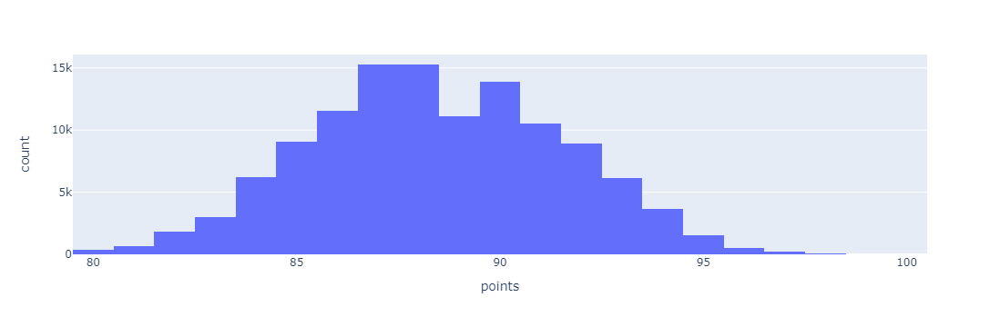

In [39]:
px.histogram(wine_reviews, 'points')

the data is not normally distributed and has more values in 80-85 than in in 90-100 area.

in the next section we will look for correlation between coloumns

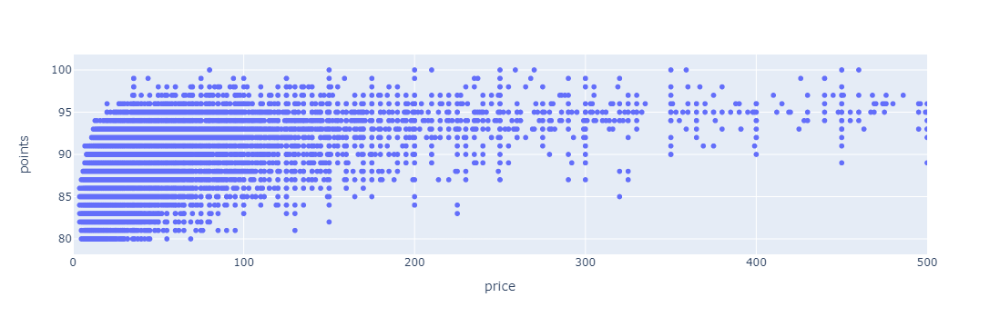

In [40]:
fig1=px.scatter(wine_reviews, x='price', y='points')
fig1.update_xaxes(range=[0,500])

after narrowing the x axis to zoom in on the highly dense area of the graph we can see that the price does not necesseraly impact the score of the wine
in my NLP model below I included all features but if i would want to reduce number of features i would drop the price coloumn

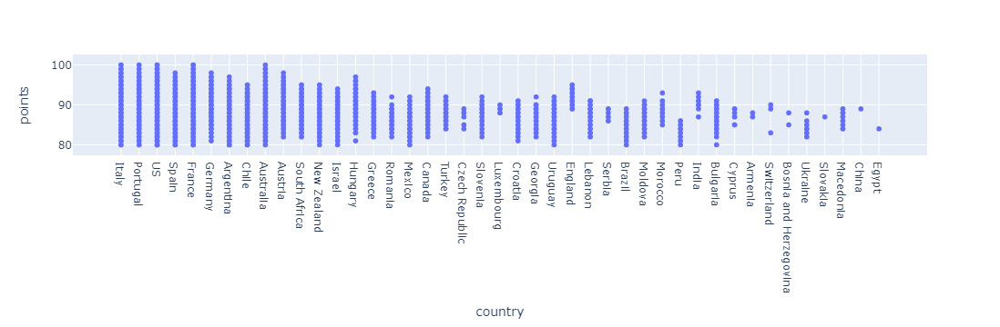

In [41]:
fig2=px.scatter(wine_reviews, x='country', y='points')
fig2


## Points prediction

Points is descrete value target. There for we are talking about a prediction (Regression) problem (in contrary to classification problem). Prediction solutions can be measured in few metrics:

* MSE - [Mean score error](https://en.wikipedia.org/wiki/Mean_squared_error)
* R2 - [R Square](https://en.wikipedia.org/wiki/Coefficient_of_determination)
* MAE - [Mean absolut error](https://en.wikipedia.org/wiki/Mean_absolute_error)

Read more [here](https://towardsdatascience.com/what-are-the-best-metrics-to-evaluate-your-regression-model-418ca481755b)

### Train and test set split

To properly report results, let's split to train and test datasets:

In [43]:
train_data = wine_reviews.sample(frac = 0.8)
test_data = wine_reviews[~wine_reviews.index.isin(train_data.index)]
assert(len(train_data) + len(test_data) == len(wine_reviews))

In [44]:
len(test_data), len(train_data)

(23979, 95916)

### Baselines

In [45]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [46]:
def calc_prediction_quality(df, pred_score_col, true_score_col):
    return pd.Series({'MSE': mean_squared_error(df[true_score_col], df[pred_score_col]),
                      'MAE': mean_absolute_error(df[true_score_col], df[pred_score_col]),
                      'R2': r2_score(df[true_score_col], df[pred_score_col])})

#### Baseline 1

The most basic baseline is simply the average points. The implementaion is as simple as:

In [47]:
test_data['basiline_1_predicted_points'] = train_data.points.mean()
b1_stats = calc_prediction_quality(test_data, 'basiline_1_predicted_points', 'points')
b1_stats

MSE    9.500594
MAE    2.525322
R2    -0.000009
dtype: float64

#### Basline 2

We can probably improve by predicting the average score based on the origin country:

In [48]:
avg_points_by_country = train_data.groupby('country').points.mean()
avg_points_by_country.head()

country
Argentina                 86.629260
Armenia                   87.500000
Australia                 88.557168
Austria                   90.102689
Bosnia and Herzegovina    86.500000
Name: points, dtype: float64

In [49]:
test_data['basiline_2_predicted_points'] = test_data.country.map(avg_points_by_country).fillna(train_data.points.mean())
b2_stats = calc_prediction_quality(test_data, 'basiline_2_predicted_points', 'points')
b2_stats

MSE    9.006145
MAE    2.453214
R2     0.052035
dtype: float64

### Baseline 3

Adding more breakdowns will increase our granularity but can result in overfitting. Yet:

In [50]:
avg_points_by_country_and_region = train_data.groupby(['country','province']).points.mean().rename('basiline_3_predicted_points')
avg_points_by_country_and_region.head()

country    province        
Argentina  Mendoza Province    86.738869
           Other               85.966019
Armenia    Armenia             87.500000
Australia  Australia Other     85.621469
           New South Wales     87.641791
Name: basiline_3_predicted_points, dtype: float64

In [51]:
test_data_with_baseline_3 = test_data.merge(avg_points_by_country_and_region, on = ['country','province'], how='left')
test_data_with_baseline_3.basiline_3_predicted_points = test_data_with_baseline_3.basiline_3_predicted_points.fillna(test_data_with_baseline_3.basiline_2_predicted_points).fillna(test_data.basiline_1_predicted_points)
test_data_with_baseline_3.shape, test_data.shape

((23979, 15), (23979, 14))

In [52]:
b3_stats = calc_prediction_quality(test_data_with_baseline_3, 'basiline_3_predicted_points', 'points')
b3_stats

MSE    8.457364
MAE    2.359636
R2     0.109799
dtype: float64

### Baselines summary

In [53]:
baseline_summary = pd.DataFrame([b1_stats, b2_stats, b3_stats], index=['baseline_1', 'baseline_2','baseline_3'])
baseline_summary

,MSE,MAE,R2
baseline_1,9.500594,2.525322,-0.000009
baseline_2,9.006145,2.453214,0.052035
baseline_3,8.457364,2.359636,0.109799


In [54]:
baseline_summary.to_csv('data/baselines_summary.csv', index=False)

## Training a Boosting trees regressor

In [55]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

#### Preparing data - Lable encoding categorical features

In [56]:
categorical_features = ['country','province','region_1','region_2','taster_name','variety','winery']
numerical_features = ['price']
features = categorical_features + numerical_features

In [57]:
encoded_features = wine_reviews[categorical_features].apply(lambda col: le.fit_transform(col.fillna('NA')))
encoded_features['price'] = wine_reviews.price.fillna(-1)
encoded_features['points'] = wine_reviews.points
encoded_features.head()
encoded_features

,country,province,region_1,region_2,taster_name,variety,winery,price,points
0,22,331,424,6,9,684,11602,35.626073,87
1,31,108,738,6,16,447,12948,15.000000,87
2,40,268,1218,17,15,433,13010,14.000000,87
3,40,218,549,6,0,476,14379,13.000000,87
4,40,268,1218,17,15,437,14609,65.000000,87
...,...,...,...,...,...,...,...,...,...
129966,17,232,738,6,1,476,6641,28.000000,90
129967,40,268,788,11,15,437,4774,75.000000,90
129968,15,11,21,6,16,209,5927,30.000000,90
129969,15,11,21,6,16,433,6025,32.000000,90


#### Re-splitting to train and test

In [58]:
train_encoded_features = encoded_features[encoded_features.index.isin(train_data.index)]
test_encoded_features = encoded_features[encoded_features.index.isin(test_data.index)]
assert(len(train_encoded_features) + len(test_encoded_features) == len(wine_reviews))

#### Fitting a tree-regressor

In [59]:
from src.models import i_feel_lucky_xgboost_training

In [60]:
train_encoded_features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95916 entries, 0 to 129970
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      95916 non-null  int32  
 1   province     95916 non-null  int32  
 2   region_1     95916 non-null  int32  
 3   region_2     95916 non-null  int32  
 4   taster_name  95916 non-null  int32  
 5   variety      95916 non-null  int32  
 6   winery       95916 non-null  int32  
 7   price        95916 non-null  float64
 8   points       95916 non-null  int64  
dtypes: float64(1), int32(7), int64(1)
memory usage: 4.8 MB


In [62]:
xgb_clf, clf_name = i_feel_lucky_xgboost_training(train_encoded_features, test_encoded_features, features, 'points', name='xgb_clf_points_prediction')

Let's look at the function output - specifically the **xgb_clf_points_prediction** column:

In [63]:
test_encoded_features.head()

,country,province,region_1,region_2,taster_name,variety,winery,price,points,xgb_clf_points_prediction
3,40,218,549,6,0,476,14379,13.0,87,86
6,22,331,1205,6,9,186,15002,16.0,87,87
20,40,398,1201,6,0,470,12960,23.0,87,86
26,22,331,1063,6,9,684,14461,13.0,87,87
29,40,51,242,2,19,137,4790,16.0,86,87


In [64]:
xgb_stats = calc_prediction_quality(test_encoded_features, 'xgb_clf_points_prediction','points')
xgb_stats

MSE    6.451603
MAE    1.918804
R2     0.320920
dtype: float64

In [65]:
all_compared = pd.DataFrame([b1_stats, b2_stats, b3_stats, xgb_stats], index=['baseline_1', 'baseline_2','baseline_3','regression_by_xgb'])
all_compared

,MSE,MAE,R2
baseline_1,9.500594,2.525322,-0.000009
baseline_2,9.006145,2.453214,0.052035
baseline_3,8.457364,2.359636,0.109799
regression_by_xgb,6.451603,1.918804,0.320920


In [66]:
all_compared.to_csv('data/all_models_compared.csv', index=False)

## Classical NLP approaches

### Using only the text from the "description" column

In [67]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import re as regex
stopwords=nltk.corpus.stopwords.words("english") + nltk.corpus.stopwords.words("italian") + nltk.corpus.stopwords.words("spanish")+ nltk.corpus.stopwords.words("french")


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Maya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Maya\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Maya\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


##### cleaning the data: the cleaning includes removing stopwords and spacers and converting all words to lower case
the "clean" data will be used throughout the entire workbook for all models

In [68]:
wine_reviews['description']=wine_reviews['description'].str.lower()


In [69]:
wine_reviews.description=wine_reviews.description.apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))

In [70]:
specialChars = ''.join([",", ":", "\"", "=", "&", ";", "%", "$","@", "%", "^", "*", "(", ")", "{", "}",'–','“', '”'
                      "[", "]", "|", "/", "\\", ">", "<", "-","!", "?", ".", "'","--", "---", "#", '‘', '’', '…'])


In [71]:
def remove_special_chars(description): 
    return description.apply(lambda description: ''.join([c for c in description if c not in specialChars]))

In [72]:
wine_reviews.description=remove_special_chars(wine_reviews.description)

In [73]:
wine_reviews.description=wine_reviews.description.apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))

In [74]:
wine_reviews.description.head(10)

0    aromas include tropical fruit broom brimstone ...
1    ripe fruity wine smooth still structured firm ...
2    tart snappy flavors lime flesh rind dominate g...
3    pineapple rind lemon pith orange blossom start...
4    much like regular bottling 2012 comes across r...
5    blackberry raspberry aromas show typical navar...
6    heres bright informal red opens aromas candied...
7    dry restrained wine offers spice profusion bal...
8    savory dried thyme notes accent sunnier flavor...
9    great depth flavor fresh apple pear fruits tou...
Name: description, dtype: object





#### using the same split that was used in previous models


In [75]:
train_NLP = wine_reviews[wine_reviews.index.isin(train_data.index)]
test_NLP = wine_reviews[wine_reviews.index.isin(test_data.index)]
assert(len(train_NLP) + len(test_NLP) == len(wine_reviews))

In [76]:
all_words = [word for description in train_NLP.description for word in nltk.word_tokenize(description)  if word.lower() not in stopwords] # Words without stop words


In [77]:
words_df = pd.DataFrame(data = all_words, columns = ['word']).word.value_counts().reset_index()
words_df.columns = ['word','wordCount']
words_df['wordImportance'] = len(words_df) / words_df.wordCount / words_df.wordCount.max()
words_df.head()

,word,wordCount,wordImportance
0,wine,57625,0.000012
1,flavors,46342,0.000016
2,fruit,33212,0.000022
3,aromas,28945,0.000025
4,palate,27733,0.000026


In [78]:
print("Total of {} words, {} unique words".format(len(all_words), len(words_df)))
print ("Using words with 8 or more appearnces will reduce the corpus size to: {}".format(sum(words_df.wordCount >= 8)))
words_df = words_df[words_df.wordCount >= 8]

Total of 2391572 words, 41420 unique words
Using words with 8 or more appearnces will reduce the corpus size to: 9283


In [79]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [80]:
clean_vocab = set(words_df.word)
count_vect = CountVectorizer(vocabulary = clean_vocab, tokenizer=nltk.word_tokenize)
clean_bow_counts = count_vect.fit_transform(train_NLP.description)


In [81]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score

In [82]:
from sklearn import linear_model
reg = linear_model.Ridge
import numpy as np


#### using cross validation and a search grid to fit optimal linear regression model for the data

In [83]:
r2 = []
search_grid = np.logspace(-1, 2, num=50, endpoint=True, base=10.0)

for a in search_grid:
    model_NLP = reg( alpha=a)
    avg_score = cross_val_score(model_NLP, clean_bow_counts, y = train_NLP.points, cv = 10, scoring ='r2').mean()
    r2.append((a,avg_score))
    print(r2[len(r2)-1])

(0.1, 0.6749242994676139)
(0.11513953993264472, 0.6750161481372803)
(0.13257113655901093, 0.675146833700396)
(0.15264179671752334, 0.6752816567580588)
(0.1757510624854792, 0.6754157565489727)
(0.20235896477251572, 0.6755836120524337)
(0.2329951810515372, 0.675772781213148)
(0.2682695795279726, 0.6759755521445688)
(0.3088843596477481, 0.6762080200636736)
(0.35564803062231287, 0.6764666210427992)
(0.40949150623804254, 0.6768096164770645)
(0.47148663634573934, 0.6771350838077714)
(0.5428675439323859, 0.6775334094300323)
(0.6250551925273973, 0.6779311427156316)
(0.7196856730011519, 0.6783827088995229)
(0.8286427728546845, 0.6788642161419274)
(0.9540954763499939, 0.6794223440217113)
(1.0985411419875584, 0.6800042207492746)
(1.2648552168552958, 0.6806461350752444)
(1.4563484775012436, 0.6813471805302921)
(1.6768329368110082, 0.682064501060715)
(1.9306977288832496, 0.6828233984861147)
(2.2229964825261943, 0.6836001123647393)
(2.5595479226995357, 0.6844269978376796)
(2.9470517025518097, 0.6852

In [84]:
cv_results = pd.DataFrame(r2, columns = ['alpha', 'r2'])
opt_alpha, max_r2 = cv_results.loc[cv_results.r2.idxmax()]
print(opt_alpha, max_r2)

15.998587196060573 0.6920788385059464


In [85]:
model_NLP = reg( alpha=opt_alpha)
test_bow_counts = count_vect.fit_transform(test_NLP.description)
model_NLP.fit(clean_bow_counts,train_NLP.points)
test_NLP['pred_score'] =model_NLP.predict(test_bow_counts)
r2_scoore=r2_score(test_data.points,test_NLP.pred_score)
r2_scoore

0.6946266273873911

In [86]:
NLP_stats = calc_prediction_quality(test_NLP, 'pred_score','points')
NLP_stats

MSE    2.901202
MAE    1.343883
R2     0.694627
dtype: float64

In [87]:
all_compared = pd.DataFrame([b1_stats, b2_stats, b3_stats, xgb_stats, NLP_stats], index=['baseline_1', 'baseline_2','baseline_3','regression_by_xgb','NLP'])
all_compared

,MSE,MAE,R2
baseline_1,9.500594,2.525322,-0.000009
baseline_2,9.006145,2.453214,0.052035
baseline_3,8.457364,2.359636,0.109799
regression_by_xgb,6.451603,1.918804,0.320920
NLP,2.901202,1.343883,0.694627


### Using both the text and other features

##### next we will combine all the other coloumns along with the BOW into a linear regression model

In [88]:
from sklearn.preprocessing import StandardScaler

##### scaling the encoded features(points not included) that were used in the XBG model in order to add them to the NLP model

In [89]:
scaler=StandardScaler()

In [90]:
trained_scaled=scaler.fit_transform(train_encoded_features.loc[:, train_encoded_features.columns !='points'].values)
trained_scaled_df = pd.DataFrame(trained_scaled, index=train_encoded_features.index , columns=train_encoded_features.loc[:, train_encoded_features.columns !='points'].columns)
trained_scaled_df.head()

,country,province,region_1,region_2,taster_name,variety,winery,price
0,-0.434233,1.087537,-0.601335,-0.081351,-0.891106,1.714982,0.597193,-0.001276
1,0.255100,-0.526488,0.298910,-0.081351,0.738329,0.497784,0.874766,-0.496499
2,0.944432,0.631557,1.675080,3.098070,0.505553,0.425882,0.887552,-0.520509
4,0.944432,0.631557,1.675080,3.098070,0.505553,0.446425,1.217299,0.703979
5,0.714655,0.588130,0.356250,-0.081351,-0.192777,1.216804,1.234827,-0.496499


In [91]:
scaled_test=test_encoded_features[features]

In [92]:
scaled_test = scaler.transform(scaled_test.values)
scaled_test_df = pd.DataFrame(scaled_test, index=test_encoded_features.index, columns=train_encoded_features.loc[:, train_encoded_features.columns !='points'].columns)
scaled_test_df

,country,province,region_1,region_2,taster_name,variety,winery,price
3,0.944432,0.269668,-0.242957,-0.081351,-2.986094,0.646724,1.169868,-0.544518
6,-0.434233,1.087537,1.637809,-0.081351,-0.891106,-0.842675,1.298343,-0.472490
20,0.944432,1.572469,1.626341,-0.081351,-2.986094,0.615909,0.877241,-0.304423
26,-0.434233,1.087537,1.230692,-0.081351,-0.891106,1.714982,1.186778,-0.544518
29,0.944432,-0.939041,-1.123133,-1.237504,1.436659,-1.094333,-0.807582,-0.472490
...,...,...,...,...,...,...,...,...
129928,0.714655,-0.844950,0.605681,-0.081351,-0.192777,0.615909,1.358560,0.391855
129931,-0.970380,-0.967992,-0.423579,-0.081351,0.738329,0.446425,-0.055495,1.712381
129932,-2.119267,0.255193,1.313835,-0.081351,-0.192777,0.615909,-1.692268,0.463883
129937,-1.889490,-0.077745,0.298910,-0.081351,0.738329,-0.575611,-1.422119,-0.088337


##### combining the  other fetures with the description BOW into a sparse martix

In [93]:
from scipy.sparse import coo_matrix, hstack

train_features_spares_matrix = coo_matrix(trained_scaled_df)
test_features_sparce_matrix=coo_matrix(scaled_test_df)
train_united_features = hstack((clean_bow_counts ,train_features_spares_matrix))
test_united_features=hstack((test_bow_counts,test_features_sparce_matrix))

##### using a regression model to fit an optimal alpha for regulation

In [94]:
r22 = []
search_grid = np.logspace(-1, 2, num=50, endpoint=True, base=10.0)


In [95]:
for a in search_grid:
    model_NLP2 = reg( alpha=a)
    avg_score = cross_val_score(model_NLP2, train_united_features, y = train_NLP.points, cv = 10, scoring ='r2').mean()
    r22.append((a,avg_score))
    print(r22[len(r22)-1])

(0.1, 0.6927181912926206)
(0.11513953993264472, 0.6928568897017996)
(0.13257113655901093, 0.6929295447736408)
(0.15264179671752334, 0.6930386854767315)
(0.1757510624854792, 0.693194227750159)
(0.20235896477251572, 0.6932976802235618)
(0.2329951810515372, 0.6934932052949472)
(0.2682695795279726, 0.6936773923543418)
(0.3088843596477481, 0.6938755846062148)
(0.35564803062231287, 0.6941193099881215)
(0.40949150623804254, 0.694372217317978)
(0.47148663634573934, 0.6946667761685001)
(0.5428675439323859, 0.6950328859034848)
(0.6250551925273973, 0.6953530250084612)
(0.7196856730011519, 0.695811319195039)
(0.8286427728546845, 0.6962523506584237)
(0.9540954763499939, 0.6967577949941283)
(1.0985411419875584, 0.6973003063156586)
(1.2648552168552958, 0.69785517880713)
(1.4563484775012436, 0.6984932353772546)
(1.6768329368110082, 0.6991615556773686)
(1.9306977288832496, 0.6998919245232212)
(2.2229964825261943, 0.7006137836269668)
(2.5595479226995357, 0.7013736582183075)
(2.9470517025518097, 0.702186

In [96]:
cv_results2 = pd.DataFrame(r22, columns = ['alpha', 'r2'])
opt_alpha2, max_r22 = cv_results2.loc[cv_results2.r2.idxmax()]
print(opt_alpha2, max_r22)

15.998587196060573 0.7086997977267899


##### running the model with optimal alpha obtained

In [97]:
model_NLP2 = reg( alpha=opt_alpha2)
model_NLP2.fit(train_united_features,train_encoded_features.points)
test_encoded_features['pred_score'] =model_NLP2.predict(test_united_features)
r2_scoore=r2_score(test_encoded_features.points,test_encoded_features.pred_score)
r2_scoore

0.7140423647407486

In [98]:
NLP_stats2 = calc_prediction_quality(test_encoded_features, 'pred_score','points')
NLP_stats2

MSE    2.716743
MAE    1.297744
R2     0.714042
dtype: float64

In [99]:
all_compared = pd.DataFrame([b1_stats, b2_stats, b3_stats, NLP_stats, NLP_stats2], index=['baseline_1', 'baseline_2','baseline_3','NLP_stats2','NLP_features'])
all_compared

,MSE,MAE,R2
baseline_1,9.500594,2.525322,-0.000009
baseline_2,9.006145,2.453214,0.052035
baseline_3,8.457364,2.359636,0.109799
NLP_stats2,2.901202,1.343883,0.694627
NLP_features,2.716743,1.297744,0.714042


the combiniation of the scaled fetures along with the descriprtion yielded the best outcome with a MSE of 2.67.
ruinning the same model without scaling the fetures did not yield good results as the impact of each colomnn was affected by the magnitude of the value

## Deep Learning approaches

### Fully connected network on the text only

#### Tokenization

In [125]:
import tensorflow as tf
from tensorflow.keras.layers import TextVectorization, Embedding, Dense, GlobalAveragePooling1D, Dropout
from tensorflow.keras.callbacks import EarlyStopping

What is a good size for the vocabulary? 

In [126]:
wine_reviews.description.apply(lambda x: len(x.split(' '))).quantile([0.95, 0.99])

0.95    37.0
0.99    44.0
Name: description, dtype: float64

In [127]:
vocab_size = 32000
sequence_length = 40

# Use the text vectorization layer to normalize, split, and map strings to integers. Set maximum_sequence length as all samples are not of the same length.
vectorize_layer = TextVectorization(
    #standardize=lambda text: tf.strings.lower(text), # You can use your own normalization function here
    standardize='lower_and_strip_punctuation', # Or you can use a pre-made normalization function
    max_tokens=vocab_size,    
    split='whitespace',
    output_mode='int',
    name = 'Text_processing',
    output_sequence_length=sequence_length)

In [128]:
vectorize_layer.adapt(train_data['description'])

In [129]:
sample_description = train_data['description'].sample().iloc[0]
print(sample_description)
vectorize_layer(sample_description)

This is the first release from this new winery, and was crafted by Jared Etzel using Bonnie Jean and Schindler vineyard fruit. It's a lovely mix of blueberry, raspberry and cherry flavors, lively and bright, with polished acidity and 30% new oak just peeking through. Drink it young with a nice chunk of wild salmon, or age it a few years and bring on the lamb chops. Either way, you're in for a treat.


<tf.Tensor: shape=(40,), dtype=int64, numpy=
array([    7,     8,     3,   322,  1021,    22,     7,   165,   531,
           2,   385,  1428,    32,     1, 20395,  1832,     1,  6736,
           2, 11367,   153,    16,    14,     4,   344,   276,     5,
         244,    74,     2,    26,    10,   171,     2,    62,     6,
         341,    20,     2,   700], dtype=int64)>

In [130]:
for token in vectorize_layer(sample_description).numpy()[:20]:
    print(f"{token} ---> ",vectorize_layer.get_vocabulary()[token])

7 --->  this
8 --->  is
3 --->  the
322 --->  first
1021 --->  release
22 --->  from
7 --->  this
165 --->  new
531 --->  winery
2 --->  and
385 --->  was
1428 --->  crafted
32 --->  by
1 --->  [UNK]
20395 --->  etzel
1832 --->  using
1 --->  [UNK]
6736 --->  jean
2 --->  and
11367 --->  schindler


#### Modeling

In [177]:
embedding_dim=16

model_ANN = tf.keras.Sequential([
    tf.keras.Input(shape=(1,), dtype=tf.string),
    vectorize_layer,
    Embedding(vocab_size, embedding_dim, name="embedding"),
    GlobalAveragePooling1D(),
    Dense(164, activation='relu', name='hidden_layer'),
    Dropout(0.3),
    Dense(32, activation='relu', name='hidden_layer2'),
    Dense(1, name = 'output_layer')
])

In [178]:
model_ANN.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Text_processing (TextVector  (None, 40)               0         
 ization)                                                        
                                                                 
 embedding (Embedding)       (None, 40, 16)            512000    
                                                                 
 global_average_pooling1d_9   (None, 16)               0         
 (GlobalAveragePooling1D)                                        
                                                                 
 hidden_layer (Dense)        (None, 164)               2788      
                                                                 
 dropout_13 (Dropout)        (None, 164)               0         
                                                                 
 hidden_layer2 (Dense)       (None, 32)               

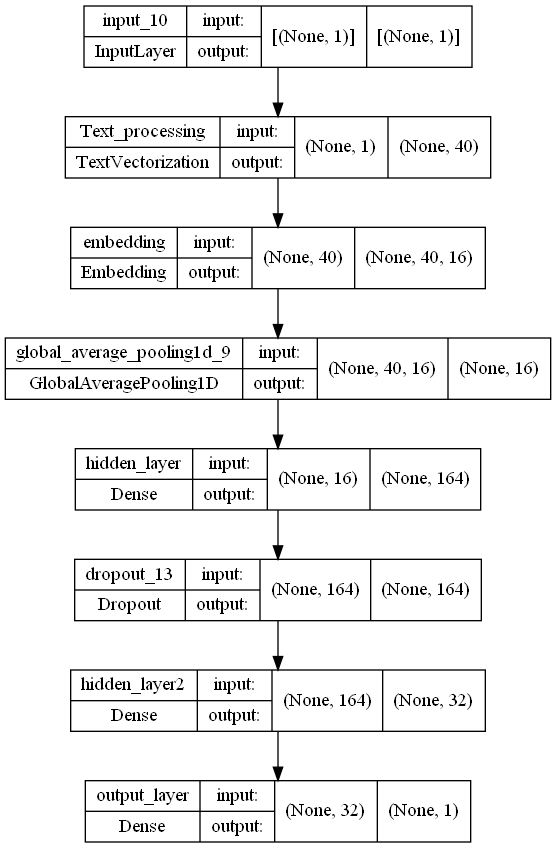

In [179]:
tf.keras.utils.plot_model(model_ANN, show_dtype=False, show_shapes=True, show_layer_names=True)

In [180]:
model_ANN.compile(
    optimizer=tf.optimizers.Adam(), loss='mean_absolute_error', metrics=['mean_squared_error','mean_absolute_error'])

In [181]:
%%time
text_col, target_col = 'description', 'points'

early_stopping_monitor = EarlyStopping(
    monitor='val_mean_squared_error',
    min_delta=0,
    patience=3,
    verbose=0,
    restore_best_weights=True
)

history = model_ANN.fit(
    train_data[text_col],
    train_data[target_col],
    epochs=20,
    batch_size=128,
    verbose=1,    
    callbacks=[early_stopping_monitor],
    validation_data = (test_data[text_col], test_data[target_col]))

Epoch 1/20
750/750 [==============================] - 15s 18ms/step - loss: 16.8438 - mean_squared_error: 1008.5833 - mean_absolute_error: 16.8438 - val_loss: 2.2344 - val_mean_squared_error: 8.2516 - val_mean_absolute_error: 2.2344
Epoch 2/20
750/750 [==============================] - 13s 17ms/step - loss: 5.0857 - mean_squared_error: 40.6245 - mean_absolute_error: 5.0857 - val_loss: 1.9413 - val_mean_squared_error: 6.1821 - val_mean_absolute_error: 1.9413
Epoch 3/20
750/750 [==============================] - 13s 17ms/step - loss: 4.8974 - mean_squared_error: 37.6689 - mean_absolute_error: 4.8974 - val_loss: 1.8807 - val_mean_squared_error: 5.7698 - val_mean_absolute_error: 1.8807
Epoch 4/20
750/750 [==============================] - 13s 17ms/step - loss: 4.7466 - mean_squared_error: 35.4042 - mean_absolute_error: 4.7466 - val_loss: 1.7165 - val_mean_squared_error: 4.8058 - val_mean_absolute_error: 1.7165
Epoch 5/20
750/750 [==============================] - 13s 17ms/step - loss: 4.62

### Simple NN Prediction & Evaluation

In [136]:
test_data['Ann_prediction'] = model_ANN.predict(test_data[text_col])

In [137]:
nn_stats=calc_prediction_quality(test_data, 'Ann_prediction', target_col)

In [138]:
all_compared = pd.DataFrame([b1_stats, b2_stats, b3_stats, xgb_stats, NLP_stats,nn_stats], index=['baseline_1', 'baseline_2','baseline_3','regression_by_xgb','NLP',"AVG_NN"])
all_compared

,MSE,MAE,R2
baseline_1,9.599848,2.539489,-0.000071
baseline_2,9.109136,2.468062,0.051050
baseline_3,8.566873,2.372150,0.107540
regression_by_xgb,6.408858,1.914759,0.332353
NLP,2.859828,1.334710,0.702075
AVG_NN,3.093880,1.367420,0.677693


### Descriptions words concatinated

In [884]:
import tensorflow as tf
from tensorflow.keras.layers import Reshape, Dense, Dropout, Embedding
from tensorflow.keras import Sequential

In [885]:
embedding_dim=16

model_CNN = tf.keras.Sequential([
    tf.keras.Input(shape=(1,), dtype=tf.string),
    vectorize_layer,
    Embedding(vocab_size, embedding_dim, name="embedding", ),
    Reshape((embedding_dim * sequence_length, ), name='concat_words'),
    Dropout(0.3),
    Dense(250, activation='relu', name='hidden_layer'),
    Dense(128, activation='relu', name='hidden_layer2'),
    Dense(1, name = 'output_layer')
])

In [886]:
model_CNN.compile(
    optimizer=tf.optimizers.Adam(), loss='mean_absolute_error', metrics=['mean_squared_error','mean_absolute_error'])

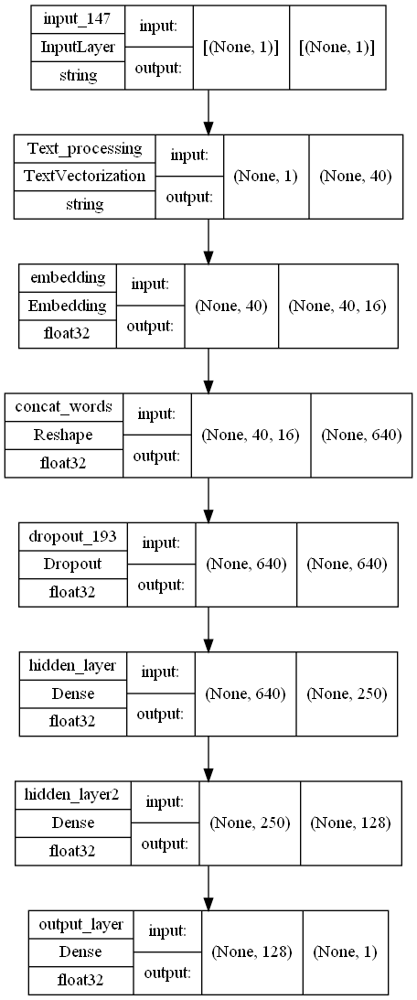

In [887]:
tf.keras.utils.plot_model(model_CNN, show_dtype=True, show_shapes=True, show_layer_names=True)

In [888]:
%%time
text_col, target_col = 'description', 'points'

early_stopping_monitor = EarlyStopping(
    monitor='val_mean_squared_error',
    min_delta=0,
    patience=3,
    verbose=0,
    restore_best_weights=True
)

history = model_CNN.fit(
    train_data[text_col],
    train_data[target_col],
    epochs=20,
    batch_size=128,
    verbose=1,    
    callbacks=[early_stopping_monitor],
    validation_data = (test_data[text_col], test_data[target_col]))

Epoch 1/20
750/750 [==============================] - 23s 30ms/step - loss: 7.6871 - mean_squared_error: 344.6891 - mean_absolute_error: 7.6871 - val_loss: 2.1786 - val_mean_squared_error: 7.7179 - val_mean_absolute_error: 2.1786
Epoch 2/20
750/750 [==============================] - 23s 30ms/step - loss: 2.5454 - mean_squared_error: 10.3710 - mean_absolute_error: 2.5454 - val_loss: 1.9480 - val_mean_squared_error: 5.9764 - val_mean_absolute_error: 1.9480
Epoch 3/20
750/750 [==============================] - 23s 31ms/step - loss: 2.0291 - mean_squared_error: 6.5646 - mean_absolute_error: 2.0291 - val_loss: 1.7084 - val_mean_squared_error: 4.6615 - val_mean_absolute_error: 1.7084
Epoch 4/20
750/750 [==============================] - 22s 30ms/step - loss: 1.6359 - mean_squared_error: 4.2878 - mean_absolute_error: 1.6359 - val_loss: 1.5390 - val_mean_squared_error: 3.7717 - val_mean_absolute_error: 1.5390
Epoch 5/20
750/750 [==============================] - 23s 30ms/step - loss: 1.4844 - 

In [889]:
test_data['nn2_prediction'] = model_CNN.predict(test_data[text_col])

In [890]:
NN_CONCAT=calc_prediction_quality(test_data, 'nn2_prediction', target_col)
NN_CONCAT

MSE    3.448273
MAE    1.465636
R2     0.633064
dtype: float64

In [891]:
all_compared = pd.DataFrame([b1_stats, b2_stats, b3_stats, xgb_stats, NLP_stats, NLP_stats2,nn_stats,NN_CONCAT], index=['baseline_1', 'baseline_2','baseline_3','regression_by_xgb','NLP','NLP_fetures',"AVG_NN", "NN_concat"])
all_compared

,MSE,MAE,R2
baseline_1,9.397974,2.517679,-0.000052
baseline_2,8.942094,2.451387,0.048459
baseline_3,8.392874,2.356766,0.106902
regression_by_xgb,6.446287,1.926827,0.322976
NLP,2.893883,1.342336,0.692058
NLP_fetures,2.760703,1.300069,0.706230
AVG_NN,3.154658,1.384396,0.664308
NN_concat,3.448273,1.465636,0.633064


### Using external embedding (description feature only)

####  using external embedding and avareging the embeding vectors


##### loading the external embedding

In [892]:
path_to_glove_file = "C:/Users/Maya/Desktop/Python-ML/new/Python_ML-2022/Final project/data/archive/glove.6B.300d.txt"
path_to_glove_file

embeddings_index = {}
with open(path_to_glove_file) as f:
    for line in f:
        word, coefs = line.split(maxsplit=1)
        coefs = np.fromstring(coefs, "f", sep=" ")
        embeddings_index[word] = coefs

print("Found %s word vectors." % len(embeddings_index))

Found 400000 word vectors.


In [893]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

In [894]:
from tensorflow.keras.layers import TextVectorization

vectorizer = TextVectorization(max_tokens=10000, output_sequence_length=300)
text_ds = tf.data.Dataset.from_tensor_slices(train_data.description).batch(64)
vectorizer.adapt(text_ds)

In [895]:
voc = vectorizer.get_vocabulary()
word_index = dict(zip(voc, range(len(voc))))

In [896]:
num_tokens = len(voc) + 2
embedding_dim = 300
hits = 0
misses = 0

# Prepare embedding matrix
embedding_matrix = np.zeros((num_tokens, embedding_dim))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in embedding index will be all-zeros.
        # This includes the representation for "padding" and "OOV"
        embedding_matrix[i] = embedding_vector
        hits += 1
    else:
        misses += 1
print("Converted %d words (%d misses)" % (hits, misses))

Converted 8534 words (1466 misses)


##### building the nn model

In [897]:
from tensorflow.keras.layers import Embedding

embedding_layer = Embedding(
    num_tokens,
    embedding_dim,
    embeddings_initializer=keras.initializers.Constant(embedding_matrix),
    trainable=True,
)

In [898]:
model_emb = tf.keras.Sequential([
    tf.keras.Input(shape=(1,), dtype=tf.string),
    vectorizer,
    embedding_layer,
    GlobalAveragePooling1D(),
    Dropout(0.2),
    Dense(64, activation='relu', name='hidden_layer'),
    Dense(32, activation='relu',name='hidden2'),

    Dense(1, name = 'output_layer')
])

In [899]:
model_emb.compile(
   tf.optimizers.Adam(), loss='mean_squared_error', metrics=['mean_squared_error','mean_absolute_error'])

early_stopping_monitor = EarlyStopping(
    monitor='val_mean_squared_error',
    min_delta=0,
    patience=3,
    verbose=0,
    restore_best_weights=True
)


In [900]:
history_emb = model_emb.fit(
    train_data[text_col],
    train_data[target_col],
    epochs=20,
    batch_size=128,
    verbose=1,    
    callbacks=[early_stopping_monitor],
    validation_data = (test_data[text_col], test_data[target_col]))

Epoch 1/20
750/750 [==============================] - 54s 71ms/step - loss: 647.7839 - mean_squared_error: 647.7839 - mean_absolute_error: 10.8668 - val_loss: 5.1930 - val_mean_squared_error: 5.1930 - val_mean_absolute_error: 1.8244
Epoch 2/20
750/750 [==============================] - 53s 71ms/step - loss: 10.6857 - mean_squared_error: 10.6857 - mean_absolute_error: 2.6020 - val_loss: 3.7589 - val_mean_squared_error: 3.7589 - val_mean_absolute_error: 1.5391
Epoch 3/20
750/750 [==============================] - 54s 73ms/step - loss: 9.6215 - mean_squared_error: 9.6215 - mean_absolute_error: 2.4744 - val_loss: 3.2965 - val_mean_squared_error: 3.2965 - val_mean_absolute_error: 1.4348
Epoch 4/20
750/750 [==============================] - 55s 73ms/step - loss: 9.2426 - mean_squared_error: 9.2426 - mean_absolute_error: 2.4199 - val_loss: 3.1586 - val_mean_squared_error: 3.1586 - val_mean_absolute_error: 1.4034
Epoch 5/20
750/750 [==============================] - 55s 73ms/step - loss: 8.947

In [901]:
test_data['emb_prediction'] = model_emb.predict(test_data.description)

In [902]:
emb_stat=calc_prediction_quality(test_data, 'emb_prediction', target_col)

In [903]:
all_compared = pd.DataFrame([b1_stats, b2_stats, b3_stats, xgb_stats, NLP_stats,NLP_stats2,nn_stats,NN_CONCAT, emb_stat], index=['baseline_1', 'baseline_2','baseline_3','regression_by_xgb','NLP',"NLP_with_features","NN", "NN_concat","DNN_embeded"])
all_compared

,MSE,MAE,R2
baseline_1,9.397974,2.517679,-0.000052
baseline_2,8.942094,2.451387,0.048459
baseline_3,8.392874,2.356766,0.106902
regression_by_xgb,6.446287,1.926827,0.322976
NLP,2.893883,1.342336,0.692058
NLP_with_features,2.760703,1.300069,0.706230
NN,3.154658,1.384396,0.664308
NN_concat,3.448273,1.465636,0.633064
DNN_embeded,2.869157,1.333839,0.694689


#####  using external embeding with the largest volabulary set gives similar results as NLP+ features is obtained

### Using LSTM or RNN Layer, (description feature only)

In [904]:
embedding_dim=16
lstm_layer = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64))

model_lstm = tf.keras.Sequential([
    tf.keras.Input(shape=(1,), dtype=tf.string),
    vectorize_layer,
    Embedding(vocab_size, embedding_dim, name="embedding", mask_zero=True),
    Dropout(0.5),
    lstm_layer,
    Dense(32, activation='relu', name='hidden_layer'),
    Dense(16, activation='relu', name= 'hidden3'),
    Dense(1, name = 'output_layer')
])

In [ ]:
tf.keras.utils.plot_model(model_lstm, show_dtype=True, show_shapes=True, show_layer_names=True)

In [799]:
model_lstm.compile(
    optimizer=tf.optimizers.Adam(), loss='mean_absolute_error', metrics=['mean_squared_error','mean_absolute_error'])

In [800]:
%%time
text_col, target_col = 'description', 'points'

early_stopping_monitor = EarlyStopping(
    monitor='val_mean_squared_error',
    min_delta=0,
    patience=3,
    verbose=0,
    restore_best_weights=True
)

history = model_lstm.fit(
    train_data[text_col],
    train_data[target_col],
    epochs=20,
    batch_size=128,
    verbose=1,    
    callbacks=[early_stopping_monitor],
    validation_data = (test_data[text_col], test_data[target_col]))

Epoch 1/20
750/750 [==============================] - 260s 340ms/step - loss: 2.6001 - mean_squared_error: 24.5783 - mean_absolute_error: 2.6001 - val_loss: 1.5674 - val_mean_squared_error: 4.1317 - val_mean_absolute_error: 1.5674
Epoch 2/20
750/750 [==============================] - 262s 349ms/step - loss: 1.5360 - mean_squared_error: 3.9146 - mean_absolute_error: 1.5360 - val_loss: 1.4408 - val_mean_squared_error: 3.5267 - val_mean_absolute_error: 1.4408
Epoch 3/20
750/750 [==============================] - 262s 350ms/step - loss: 1.4502 - mean_squared_error: 3.4645 - mean_absolute_error: 1.4502 - val_loss: 1.4204 - val_mean_squared_error: 3.4064 - val_mean_absolute_error: 1.4204
Epoch 4/20
750/750 [==============================] - 263s 351ms/step - loss: 1.3995 - mean_squared_error: 3.2478 - mean_absolute_error: 1.3995 - val_loss: 1.4096 - val_mean_squared_error: 3.3619 - val_mean_absolute_error: 1.4096
Epoch 5/20
750/750 [==============================] - 265s 353ms/step - loss: 1

In [801]:
test_data['LSTM_prediction'] = model_lstm.predict(test_data.description)

In [802]:
lstm_stat=calc_prediction_quality(test_data, 'LSTM_prediction', target_col)

## final results

In [927]:
all_compared = pd.DataFrame([b1_stats, b2_stats, b3_stats, xgb_stats, NLP_stats,NLP_stats2,nn_stats,NN_CONCAT, emb_stat, lstm_stat], index=['baseline_1', 'baseline_2','baseline_3','regression_by_xgb','NLP',"NLP_with_features","NN", "NN_concat","NN_embeded", "NN_LSTM"])
all_compared.round(2)

,MSE,MAE,R2
baseline_1,9.40,2.52,-0.00
baseline_2,8.94,2.45,0.05
baseline_3,8.39,2.36,0.11
regression_by_xgb,6.45,1.93,0.32
NLP,2.89,1.34,0.69
NLP_with_features,2.76,1.30,0.71
NN,3.15,1.38,0.66
NN_concat,3.45,1.47,0.63
NN_embeded,2.87,1.33,0.69
NN_LSTM,3.36,1.41,0.64


### conclusion

the best models are NLP including the features and after that is the external embeding model 
after many attempts to optimize the LSTM model it could not yield results close to the optimal models and does not even show any added value in comparison to a simple nn, it also takes the longest runtime
